# Classificador de Faixas Etárias

Para a aplicação do modelo de classificação de imagens, foi criado um dataset contendo imagens de pessoas de diferentes faixas etárias, da criança ao idoso.

Dessa forma, dividimos os dataset em 3 classes, Criança (Child), Adulto (Adult) e Idoso (Elderly).

## Extração e tratamento do dataset criado

In [1]:
#Clonando o dataset de imagens para o notebook
!git clone https://github.com/radiroc/Humans_Image.git

Cloning into 'Humans_Image'...
remote: Enumerating objects: 1551, done.
remote: Total 1551 (delta 0), reused 0 (delta 0), pack-reused 1551
Receiving objects: 100% (1551/1551), 311.36 MiB | 48.30 MiB/s, done.
Resolving deltas: 100% (22/22), done.
Checking out files: 100% (1080/1080), done.


In [2]:
import os
import shutil
import re

dir_train = 'HumanImage/train'
dir_val = 'HumanImage/val'
os.makedirs(dir_train)
os.makedirs(dir_val)

In [3]:
def folder_train(classe):
  folder_train = dir_train + '/' + classe

  os.makedirs(folder_train)

  orig_folder = 'Humans_Image/Humans/' + classe + '/train'

  files_train = os.listdir(orig_folder)
  
  for f in files_train:
    orig_file = orig_folder + '/' + f
    shutil.copy(orig_file, folder_train)


def folder_val(classe):
  folder_val = dir_val + '/' + classe

  os.makedirs(folder_val)

  orig_folder = 'Humans_Image/Humans/' + classe + '/val'

  files_val = os.listdir(orig_folder)
  
  for f in files_val:
    orig_file = orig_folder + '/' + f
    shutil.copy(orig_file, folder_val)



In [4]:
#Criacao de pastas de treino das classes Adult, Child e Elderly

adult = 'Adult'
child = 'Child'
elder = 'Elderly'

folder_train(adult)
folder_train(child)
folder_train(elder)

In [5]:
#Criacao de pastas de teste das classes Adult, Child e Elderly

folder_val(adult)
folder_val(child)
folder_val(elder)

In [6]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import numpy as np
import time
import os
import copy

In [7]:
mean_nums = [0.485, 0.456, 0.406]
std_nums = [0.229, 0.224, 0.225]

chosen_transforms = {'train': transforms.Compose([
        transforms.RandomResizedCrop(size=400),
        transforms.RandomRotation(degrees=18),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean_nums, std_nums)
]), 'val': transforms.Compose([
        transforms.Resize(400),
        transforms.CenterCrop(300),
        transforms.ToTensor(),
        transforms.Normalize(mean_nums, std_nums)
])
}

In [8]:
dir = 'HumanImage/'

chosen_datasets = {x: datasets.ImageFolder(os.path.join(dir, x), chosen_transforms[x]) for x in ['train','val']}

In [9]:
chosen_datasets

{'train': Dataset ImageFolder
     Number of datapoints: 756
     Root location: HumanImage/train
     StandardTransform
 Transform: Compose(
                RandomResizedCrop(size=(400, 400), scale=(0.08, 1.0), ratio=(0.75, 1.3333), interpolation=bilinear)
                RandomRotation(degrees=[-18.0, 18.0], interpolation=nearest, expand=False, fill=0)
                RandomHorizontalFlip(p=0.5)
                ToTensor()
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ), 'val': Dataset ImageFolder
     Number of datapoints: 324
     Root location: HumanImage/val
     StandardTransform
 Transform: Compose(
                Resize(size=400, interpolation=bilinear, max_size=None, antialias=None)
                CenterCrop(size=(300, 300))
                ToTensor()
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            )}

In [10]:
#Criando dataloaders para futuras iteracoes

dataloaders = {x: torch.utils.data.DataLoader(chosen_datasets[x], batch_size=4,
  shuffle=True, num_workers=4)
              for x in ['train', 'val']}

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [11]:
dataloaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x7feba68cf450>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x7feba68cf590>}

In [12]:
data_size =  {x: len(chosen_datasets[x]) for x in ['train', 'val']}
data_class = chosen_datasets['train'].classes

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(data_size)
print(data_class)

{'train': 756, 'val': 324}
['Adult', 'Child', 'Elderly']


In [13]:
#visualizando figuras

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([mean_nums])
    std = np.array([std_nums])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)  
    plt.pause(0.001)

In [14]:
#selecao de parte dos dados de treinamento para visulizacao
inputs, classes = next(iter(dataloaders['train']))

#construcao de grid com os dados coletados (inputs)

out = torchvision.utils.make_grid(inputs)


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


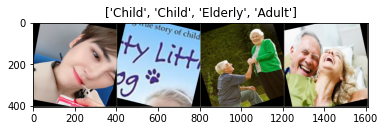

In [15]:
imshow(out, title=[data_class[x] for x in classes])

##Configuracão de modelo de reconhecimento pré-treinado

In [16]:


res_mod = models.resnet34(pretrained=True)

num_ftrs = res_mod.fc.in_features
res_mod.fc = nn.Linear(num_ftrs, 3)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [115]:

res_mod = res_mod.to(device)
criterion = nn.CrossEntropyLoss()

# definindo o otimizador SGD
optimizer_ft = optim.SGD(res_mod.parameters(), lr=0.001, momentum=0.9)

# Decrementador do Learning Rate para um fator de 0,1 a cada 7 epocas
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [106]:
epoch_m =[]
phase_m = []
loss_m =[]
acc_m =[]

def train_model(model, criterion, optimizer, scheduler, num_epochs=10):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        

   
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  
            else:
                model.eval()   

            epoch_m.append(epoch)
            phase_m.append(phase)

            current_loss = 0.0
            current_corrects = 0

            print('Iterating through data...')

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)


                optimizer.zero_grad()


                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)


                    if phase == 'train':
                        loss.backward()
                        optimizer.step()


                current_loss += loss.item() * inputs.size(0)
                current_corrects += torch.sum(preds == labels.data)

            epoch_loss = current_loss / data_size[phase]
            epoch_acc = current_corrects.double() / data_size[phase]

            loss_m.append(epoch_loss)
            acc_m.append(epoch_acc)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_since = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_since // 60, time_since % 60))
    print('Best val Acc: {:4f}'.format(best_acc))


    model.load_state_dict(best_model_wts)
    return model

In [19]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_handeled = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_handeled += 1
                ax = plt.subplot(num_images//2, 2, images_handeled)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(data_class[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_handeled == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

### Resultados da aplicação do modelo no dataset utilizado

In [44]:
base_model = train_model(res_mod, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=6)


Epoch 0/5
----------
Iterating through data...


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


train Loss: 0.5053 Acc: 0.7804
Iterating through data...
val Loss: 0.4618 Acc: 0.8519

Epoch 1/5
----------
Iterating through data...
train Loss: 0.5349 Acc: 0.7950
Iterating through data...
val Loss: 0.4157 Acc: 0.8642

Epoch 2/5
----------
Iterating through data...
train Loss: 0.5290 Acc: 0.7844
Iterating through data...
val Loss: 0.4047 Acc: 0.8704

Epoch 3/5
----------
Iterating through data...
train Loss: 0.5286 Acc: 0.7765
Iterating through data...
val Loss: 0.4425 Acc: 0.8673

Epoch 4/5
----------
Iterating through data...
train Loss: 0.5277 Acc: 0.7765
Iterating through data...
val Loss: 0.4279 Acc: 0.8642

Epoch 5/5
----------
Iterating through data...
train Loss: 0.5347 Acc: 0.7910
Iterating through data...
val Loss: 0.4085 Acc: 0.8549

Training complete in 3m 26s
Best val Acc: 0.870370


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


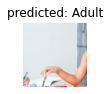

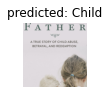

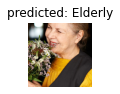

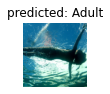

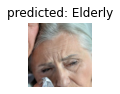

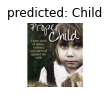

In [45]:
visualize_model(base_model)
plt.show()

### Avaliação da curva de aprendizado do modelo aplicado

In [75]:
#tratando o array de acurácia

accuracy_m = list(map(str, acc_m))

acc_m1 = [s.replace(", device='cuda:0', dtype=torch.float64)","") for s in accuracy_m]

acc_m2 =  [s.replace('tensor(', '') for s in acc_m1]

acc_m2 = list(map(float, acc_m2))

acc_m2


[0.7804,
 0.8519,
 0.795,
 0.8642,
 0.7844,
 0.8704,
 0.7765,
 0.8673,
 0.7765,
 0.8642,
 0.791,
 0.8549]

In [76]:
import pandas as pd

df_curve = pd.DataFrame({'Epoch':epoch_m, 'Phase': phase_m, 'Loss': loss_m, 'Accuracy': acc_m2})

df_curve

,Epoch,Phase,Loss,Accuracy
0,0,train,0.505252,0.7804
1,0,val,0.461804,0.8519
2,1,train,0.534867,0.7950
3,1,val,0.415738,0.8642
4,2,train,0.529036,0.7844
5,2,val,0.404736,0.8704
6,3,train,0.528633,0.7765
7,3,val,0.442485,0.8673
8,4,train,0.527669,0.7765
9,4,val,0.427890,0.8642


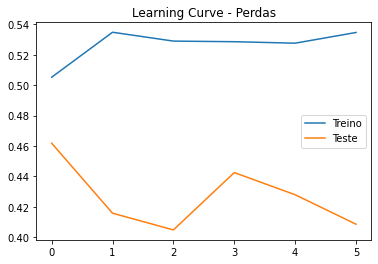

In [95]:

df_train = df_curve.loc[df_curve['Phase'] == 'train']
df_val = df_curve.loc[df_curve['Phase'] == 'val']

x=df_train['Epoch'].to_numpy()

y1 = df_train['Loss'].to_numpy()

y2 = df_val['Loss'].to_numpy()

figsize=(100, 70)
fig, ax = plt.subplots()

ax.plot(x, y1, label='Treino')
ax.plot(x, y2, label='Teste')

ax.legend()
ax.set_title("Learning Curve - Perdas")
plt.show()

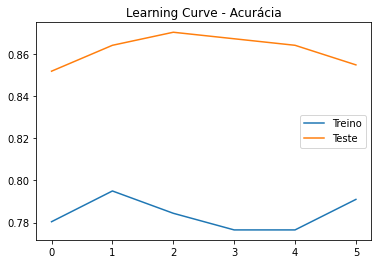

In [96]:

df_train = df_curve.loc[df_curve['Phase'] == 'train']
df_val = df_curve.loc[df_curve['Phase'] == 'val']

x=df_train['Epoch'].to_numpy()

y1 = df_train['Accuracy'].to_numpy()

y2 = df_val['Accuracy'].to_numpy()

figsize=(100, 70)
fig, ax = plt.subplots()

ax.plot(x, y1, label='Treino')
ax.plot(x, y2, label='Teste')

ax.legend()
ax.set_title("Learning Curve - Acurácia")
plt.show()

## Configuração de modelo de reconhecimento pré-treinado com recurso fixados

In [97]:
# Modelo com extrator com recursos fixados
res_mod = models.resnet34(pretrained=True)
for param in res_mod.parameters():
    param.requires_grad = False

num_ftrs = res_mod.fc.in_features
res_mod.fc = nn.Linear(num_ftrs, 3)

res_mod = res_mod.to(device)
criterion = nn.CrossEntropyLoss()



optimizer_ft = optim.SGD(res_mod.fc.parameters(), lr=0.001, momentum=0.9)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [98]:
for name, child in res_mod.named_children():
    if name in ['layer3', 'layer4']:
        print(name + 'has been unfrozen.')
        for param in child.parameters():
            param.requires_grad = True
    else:
        for param in child.parameters():
            param.requires_grad = False

layer3has been unfrozen.
layer4has been unfrozen.


In [99]:

optimizer_conv = torch.optim.SGD(filter(lambda x: x.requires_grad, res_mod.parameters()), lr=0.001, momentum=0.98)

In [107]:
epoch_m =[]
phase_m = []
loss_m =[]
acc_m =[]

### Resultado da aplicação do novo modelo com camadas fixadas

Epoch 0/5
----------
Iterating through data...


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


train Loss: 0.5445 Acc: 0.7870
Iterating through data...
val Loss: 0.4825 Acc: 0.8395

Epoch 1/5
----------
Iterating through data...
train Loss: 0.5733 Acc: 0.7725
Iterating through data...
val Loss: 0.3290 Acc: 0.8827

Epoch 2/5
----------
Iterating through data...
train Loss: 0.5215 Acc: 0.7844
Iterating through data...
val Loss: 0.3119 Acc: 0.8673

Epoch 3/5
----------
Iterating through data...
train Loss: 0.5153 Acc: 0.7857
Iterating through data...
val Loss: 0.4279 Acc: 0.8611

Epoch 4/5
----------
Iterating through data...
train Loss: 0.4825 Acc: 0.8042
Iterating through data...
val Loss: 0.3875 Acc: 0.8580

Epoch 5/5
----------
Iterating through data...
train Loss: 0.4962 Acc: 0.8135
Iterating through data...
val Loss: 0.4233 Acc: 0.8858

Training complete in 3m 24s
Best val Acc: 0.885802


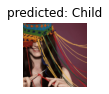

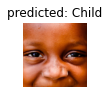

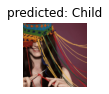

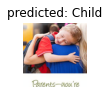

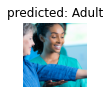

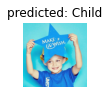

In [108]:
base_model = train_model(res_mod, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=6)
visualize_model(base_model)
plt.show()

### Avaliação da curva de aprendizdo do modelo alterado

In [109]:
#tratando o array de acurácia

accuracy_m = list(map(str, acc_m))

acc_m1 = [s.replace(", device='cuda:0', dtype=torch.float64)","") for s in accuracy_m]

acc_m2 =  [s.replace('tensor(', '') for s in acc_m1]

acc_m2 = list(map(float, acc_m2))

acc_m2



[0.787,
 0.8395,
 0.7725,
 0.8827,
 0.7844,
 0.8673,
 0.7857,
 0.8611,
 0.8042,
 0.858,
 0.8135,
 0.8858]

In [110]:
df_curve2 = pd.DataFrame({'Epoch':epoch_m, 'Phase': phase_m, 'Loss': loss_m, 'Accuracy': acc_m2})

df_curve2

,Epoch,Phase,Loss,Accuracy
0,0,train,0.544466,0.7870
1,0,val,0.482498,0.8395
2,1,train,0.573332,0.7725
3,1,val,0.328972,0.8827
4,2,train,0.521451,0.7844
5,2,val,0.311862,0.8673
6,3,train,0.515346,0.7857
7,3,val,0.427929,0.8611
8,4,train,0.482499,0.8042
9,4,val,0.387513,0.8580


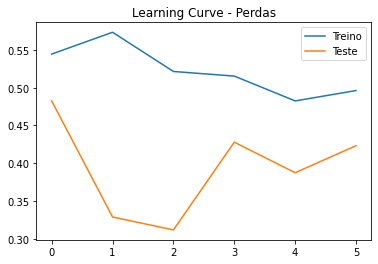

In [111]:
df_train2 = df_curve2.loc[df_curve['Phase'] == 'train']
df_val2 = df_curve2.loc[df_curve['Phase'] == 'val']

x=df_train2['Epoch'].to_numpy()

y1 = df_train2['Loss'].to_numpy()

y2 = df_val2['Loss'].to_numpy()

figsize=(100, 70)
fig, ax = plt.subplots()

ax.plot(x, y1, label='Treino')
ax.plot(x, y2, label='Teste')

ax.legend()
ax.set_title("Learning Curve - Perdas")
plt.show()

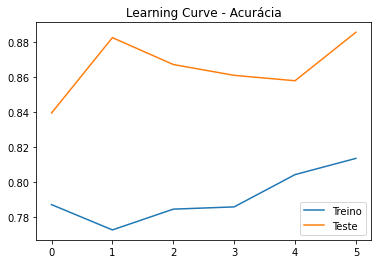

In [112]:
df_train2 = df_curve2.loc[df_curve['Phase'] == 'train']
df_val2 = df_curve2.loc[df_curve['Phase'] == 'val']

x=df_train2['Epoch'].to_numpy()

y1 = df_train2['Accuracy'].to_numpy()

y2 = df_val2['Accuracy'].to_numpy()

figsize=(100, 70)
fig, ax = plt.subplots()

ax.plot(x, y1, label='Treino')
ax.plot(x, y2, label='Teste')

ax.legend()
ax.set_title("Learning Curve - Acurácia")
plt.show()

In [113]:
torch.save(base_model.state_dict(), "/content/teste.pt" )

In [114]:
base_model.load_state_dict(torch.load("/content/teste.pt"))
base_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

# Conclusão

Devido a escolha de um dataset que utiliza imagens de pessoas e que não possui um padrão no cenário das imagens e em alguns casos, apresenta mais de uma pessoa de uma faixa etária diferente, os resultados obtidos com a classificação de imagem não foram tão altos comparado aos resultados obtidos na classificação de objetos ou animais. 
Dessa forma, uma das primeiras conclusões obtidas é que um dataset corrompido e/ou sem padrão tem impacto direto nos valores obtidos de perda e acurácia. 

Outro ponto observado através dos gráfico de curva de aprendizados consiste na diferença significativa dos resultados de perda e acurácia na bases de treino e teste, é possível notar que a base de teste possui um melhor comportamento em relação a base de treino. Uma das hipóteses para esse cenário está relacionada a forma como foi dividido o dataset entre treino e teste, onde apenas 30% de cada classe compõe o dataset de validação, ou seja, o dataset de validação possui poucas amostras,o que torna o processo de classificação menos "desafiador" para essa etapa. 

Por fim, o último ponto observado está na diferença de resultados na "Melhor Acurácia" obtido com os dois modelos, o modelo com recursos pré-fixados apresentou um valor de 0.885 enquanto o modelo com recursos ajustados teve uma melhor acurácia igual a 0.870. Logo, o conclui-se que o modelo com recursos fixados apresenta uma melhor acurárica além de um tempo de execução menor e assim, podemos afirmar que fixar algumas etapas do modelo não altera os resultados da classificação.

In [32]:
import torch.nn.functional as F

from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter()

In [33]:
def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


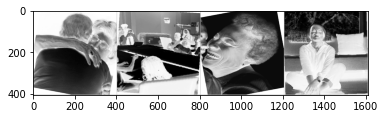

In [34]:
# get some random training images
images, labels = next(iter(dataloaders['train']))

# create grid of images
img_grid = torchvision.utils.make_grid(images)

# show images
matplotlib_imshow(img_grid, one_channel=True)

# write to tensorboard
writer.add_image('humansimage', img_grid)

In [35]:
!pip uninstall -y tensorboard tb-nightly 

!pip install tensorboard

Found existing installation: tensorboard 2.7.0
Uninstalling tensorboard-2.7.0:
  Successfully uninstalled tensorboard-2.7.0
     |████████████████████████████████| 5.8 MB 5.1 MB/s 


In [42]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>